# TensorFlow 2 Tutorials  
object detection  
---  
written by Dohyeon Kwon at 2023-07-16

## 대상 모델
TensorFlow 2 - object detection  
https://github.com/tensorflow/hub/blob/master/examples/colab/tf2_object_detection.ipynb

### 사전 설치 요구사항
NumPy 1.24.3 버전  
protobuf 3.20.3 버전  

In [8]:
!pip install numpy==1.24.3
!pip install protobuf==3.20.3

## tensorflow 2 기본 빌드

In [1]:
import os # os 기능 사용을 위한 library
import pathlib  # 범용 경로 지정을 위한 library

import matplotlib # 데이터 시각화
import matplotlib.pyplot as plt # plot 등 그래프 그리기 위해 import

import io  # 입출력 library
import scipy.misc  # imread 및 imsave 를 위한 library
'''
scipy.misc 모듈 정리
imread() 를 통해 이미지를 width*height*rgb 의 3차원 텐서로 변환한다.
imsave() 를 통해 (연산한) 이미지를 저장시킬 수 있다.
'''

import numpy as np

# six library 는 python2 로 작성된 모듈을 python3 환경에서 활용가능하도록 wrapping 해준다.
from six import BytesIO
# PIL - Python Imaging Library / 이미지 처리 및 그래픽 기능까지 제공하는 복합 라이브러리이다.
from PIL import Image, ImageDraw, ImageFont 

# tf hub에서 모델을 스크래핑하기 위한 library
from six.moves.urllib.request import urlopen

# 실제 tensorflow 모델 및 hub import
import tensorflow as tf
import tensorflow_hub as hub

# tf 설정 - 디버깅용 로그를 에러만 저장하겠다.
tf.get_logger().setLevel('ERROR')

2023-07-16 22:41:11.149938: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


## 활용가능한 멤버 목록
### 메소드
#### load_image_into_numpy_array(img_path)
이미지를 불러와서 NumPy 3차원 텐서로 바꿔주는 메소드. (height, width, rgb) 의 shape을 가짐.  
    요소의 자료형은 Unsigned int 8.  
    Helper method to load an image
### 필드
#### ALL_MODELS
- TF Hub 에 포함된 모델들을 불러올 수 있는 딕셔너리  
    {핸들 : 모델URL}  
    Map of Model Name to TF Hub handle  
#### IMAGES_FOR_TEST
- 테스트용 이미지 딕셔너리 {객체명 : 이미지URL}  
    지원 이미지 객체명 - "Beach" "Dogs" "Naxos Tarverna" "Beatles" "Phones" "Birds"  
#### COCO17_HUMAN_POSE_KEYPOINTS
- COCO 2017 데이터셋의 사람 포즈 특징점 좌표 리스트 (좌표 튜플들이 모인 2차원 배열)  
    사용을 위해 models 의 keypoints 다운로드 필요.  
    List of tuples with Human Keypoints for the COCO 2017 dataset. This is needed for models with keypoints.
    

In [2]:
# @title Run this!!

# 이미지를 불러와서 NumPy 배열화 하는 모듈. (height, width, channes)
def load_image_into_numpy_array(path):
  """Load an image from file into a numpy array.

  Puts image into numpy array to feed into tensorflow graph.
  Note that by convention we put it into a numpy array with shape
  (height, width, channels), where channels=3 for RGB.

  Args:
    path: the file path to the image

  Returns:
    uint8 numpy array with shape (img_height, img_width, 3)
  """
  image = None
  if(path.startswith('http')):
    response = urlopen(path)
    image_data = response.read()
    image_data = BytesIO(image_data)
    image = Image.open(image_data)
  else:
    image_data = tf.io.gfile.GFile(path, 'rb').read()
    image = Image.open(BytesIO(image_data))

  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (1, im_height, im_width, 3)).astype(np.uint8)


ALL_MODELS = {
'CenterNet HourGlass104 512x512' : 'https://tfhub.dev/tensorflow/centernet/hourglass_512x512/1',
'CenterNet HourGlass104 Keypoints 512x512' : 'https://tfhub.dev/tensorflow/centernet/hourglass_512x512_kpts/1',
'CenterNet HourGlass104 1024x1024' : 'https://tfhub.dev/tensorflow/centernet/hourglass_1024x1024/1',
'CenterNet HourGlass104 Keypoints 1024x1024' : 'https://tfhub.dev/tensorflow/centernet/hourglass_1024x1024_kpts/1',
'CenterNet Resnet50 V1 FPN 512x512' : 'https://tfhub.dev/tensorflow/centernet/resnet50v1_fpn_512x512/1',
'CenterNet Resnet50 V1 FPN Keypoints 512x512' : 'https://tfhub.dev/tensorflow/centernet/resnet50v1_fpn_512x512_kpts/1',
'CenterNet Resnet101 V1 FPN 512x512' : 'https://tfhub.dev/tensorflow/centernet/resnet101v1_fpn_512x512/1',
'CenterNet Resnet50 V2 512x512' : 'https://tfhub.dev/tensorflow/centernet/resnet50v2_512x512/1',
'CenterNet Resnet50 V2 Keypoints 512x512' : 'https://tfhub.dev/tensorflow/centernet/resnet50v2_512x512_kpts/1',
'EfficientDet D0 512x512' : 'https://tfhub.dev/tensorflow/efficientdet/d0/1',
'EfficientDet D1 640x640' : 'https://tfhub.dev/tensorflow/efficientdet/d1/1',
'EfficientDet D2 768x768' : 'https://tfhub.dev/tensorflow/efficientdet/d2/1',
'EfficientDet D3 896x896' : 'https://tfhub.dev/tensorflow/efficientdet/d3/1',
'EfficientDet D4 1024x1024' : 'https://tfhub.dev/tensorflow/efficientdet/d4/1',
'EfficientDet D5 1280x1280' : 'https://tfhub.dev/tensorflow/efficientdet/d5/1',
'EfficientDet D6 1280x1280' : 'https://tfhub.dev/tensorflow/efficientdet/d6/1',
'EfficientDet D7 1536x1536' : 'https://tfhub.dev/tensorflow/efficientdet/d7/1',
'SSD MobileNet v2 320x320' : 'https://tfhub.dev/tensorflow/ssd_mobilenet_v2/2',
'SSD MobileNet V1 FPN 640x640' : 'https://tfhub.dev/tensorflow/ssd_mobilenet_v1/fpn_640x640/1',
'SSD MobileNet V2 FPNLite 320x320' : 'https://tfhub.dev/tensorflow/ssd_mobilenet_v2/fpnlite_320x320/1',
'SSD MobileNet V2 FPNLite 640x640' : 'https://tfhub.dev/tensorflow/ssd_mobilenet_v2/fpnlite_640x640/1',
'SSD ResNet50 V1 FPN 640x640 (RetinaNet50)' : 'https://tfhub.dev/tensorflow/retinanet/resnet50_v1_fpn_640x640/1',
'SSD ResNet50 V1 FPN 1024x1024 (RetinaNet50)' : 'https://tfhub.dev/tensorflow/retinanet/resnet50_v1_fpn_1024x1024/1',
'SSD ResNet101 V1 FPN 640x640 (RetinaNet101)' : 'https://tfhub.dev/tensorflow/retinanet/resnet101_v1_fpn_640x640/1',
'SSD ResNet101 V1 FPN 1024x1024 (RetinaNet101)' : 'https://tfhub.dev/tensorflow/retinanet/resnet101_v1_fpn_1024x1024/1',
'SSD ResNet152 V1 FPN 640x640 (RetinaNet152)' : 'https://tfhub.dev/tensorflow/retinanet/resnet152_v1_fpn_640x640/1',
'SSD ResNet152 V1 FPN 1024x1024 (RetinaNet152)' : 'https://tfhub.dev/tensorflow/retinanet/resnet152_v1_fpn_1024x1024/1',
'Faster R-CNN ResNet50 V1 640x640' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet50_v1_640x640/1',
'Faster R-CNN ResNet50 V1 1024x1024' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet50_v1_1024x1024/1',
'Faster R-CNN ResNet50 V1 800x1333' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet50_v1_800x1333/1',
'Faster R-CNN ResNet101 V1 640x640' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet101_v1_640x640/1',
'Faster R-CNN ResNet101 V1 1024x1024' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet101_v1_1024x1024/1',
'Faster R-CNN ResNet101 V1 800x1333' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet101_v1_800x1333/1',
'Faster R-CNN ResNet152 V1 640x640' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet152_v1_640x640/1',
'Faster R-CNN ResNet152 V1 1024x1024' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet152_v1_1024x1024/1',
'Faster R-CNN ResNet152 V1 800x1333' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet152_v1_800x1333/1',
'Faster R-CNN Inception ResNet V2 640x640' : 'https://tfhub.dev/tensorflow/faster_rcnn/inception_resnet_v2_640x640/1',
'Faster R-CNN Inception ResNet V2 1024x1024' : 'https://tfhub.dev/tensorflow/faster_rcnn/inception_resnet_v2_1024x1024/1',
'Mask R-CNN Inception ResNet V2 1024x1024' : 'https://tfhub.dev/tensorflow/mask_rcnn/inception_resnet_v2_1024x1024/1'
}

IMAGES_FOR_TEST = {
  'Beach' : 'models/research/object_detection/test_images/image2.jpg',
  'Dogs' : 'models/research/object_detection/test_images/image1.jpg',
  # By Heiko Gorski, Source: https://commons.wikimedia.org/wiki/File:Naxos_Taverna.jpg
  'Naxos Taverna' : 'https://upload.wikimedia.org/wikipedia/commons/6/60/Naxos_Taverna.jpg',
  # Source: https://commons.wikimedia.org/wiki/File:The_Coleoptera_of_the_British_islands_(Plate_125)_(8592917784).jpg
  'Beatles' : 'https://upload.wikimedia.org/wikipedia/commons/1/1b/The_Coleoptera_of_the_British_islands_%28Plate_125%29_%288592917784%29.jpg',
  # By Américo Toledano, Source: https://commons.wikimedia.org/wiki/File:Biblioteca_Maim%C3%B3nides,_Campus_Universitario_de_Rabanales_007.jpg
  'Phones' : 'https://upload.wikimedia.org/wikipedia/commons/thumb/0/0d/Biblioteca_Maim%C3%B3nides%2C_Campus_Universitario_de_Rabanales_007.jpg/1024px-Biblioteca_Maim%C3%B3nides%2C_Campus_Universitario_de_Rabanales_007.jpg',
  # Source: https://commons.wikimedia.org/wiki/File:The_smaller_British_birds_(8053836633).jpg
  'Birds' : 'https://upload.wikimedia.org/wikipedia/commons/0/09/The_smaller_British_birds_%288053836633%29.jpg',
}

COCO17_HUMAN_POSE_KEYPOINTS = [(0, 1),
 (0, 2),
 (1, 3),
 (2, 4),
 (0, 5),
 (0, 6),
 (5, 7),
 (7, 9),
 (6, 8),
 (8, 10),
 (5, 6),
 (5, 11),
 (6, 12),
 (11, 12),
 (11, 13),
 (13, 15),
 (12, 14),
 (14, 16)]

### 시각화 도구
TF2 객체탐지 모델은 바운딩박스(proper detected boxes) 도구, 객체 검출기 및 다중 객체 분할기(segmentation) 활용이 가능하다.  
이를 이용하기 위해서는 TF2 Object Detection API 를 사용해야 한다.  
TF2 Object Detection API는 Tensorflow GitHub 의 "models" 저장소에 포함되어 있다.  

In [3]:
# Clone the tensorflow models repository
# --depth 1은 최근 커밋본만 가져옴을 의미. 숫자가 커질수록 이전 커밋도 가져옴.
!git clone --depth 1 https://github.com/tensorflow/models

fatal: destination path 'models' already exists and is not an empty directory.


### TF2 Object Detection API 설치
bash 쉘을 통해 설치가 이루어진다.  
1. 구글 프로토콜 버퍼(protoc) 를 활용하여 아래 경로의 모든 `.proto` 파일을 직렬화하여 Python 파일로서 저장시킨다.  
    - `models/research/object_detection/protos`  
    (protoc 는 pickle 같은 직렬화 파일 스트림 방법이자 도구이다.)  
2. `models/research/object_detection/packages/tf2/setup.py` 파일을 복사하여 `.` 으로 저장한다.
3. 복사된 `.` 파일을 기준으로 Python Package 로서 Install 한다.  
    .proto 에서 변환된 .py 파일들 또한 설치 될 것이다.  

In [4]:
%%bash
sudo apt install -y protobuf-compiler
cd models/research/
protoc object_detection/protos/*.proto --python_out=.
cp object_detection/packages/tf2/setup.py .
python -m pip install .

sudo: a terminal is required to read the password; either use the -S option to read from standard input or configure an askpass helper
sudo: a password is required


Processing /Users/dokw/Library/CloudStorage/OneDrive-한국방송통신대학교/AI_Model/models/research
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Using cached avro_python3-1.10.2-py3-none-any.whl
  Obtaining dependency information for apache-beam from https://files.pythonhosted.org/packages/a9/3e/6498bcf34a8194a2e3cc6dab0a742f4de9a28363ccd91ca37c38d3fe9cb4/apache_beam-2.48.0-cp310-cp310-macosx_10_9_x86_64.whl.metadata
  Using cached apache_beam-2.48.0-cp310-cp310-macosx_10_9_x86_64.whl.metadata (6.2 kB)
  Obtaining dependency information for Cython from https://files.pythonhosted.org/packages/3f/d6/9eed523aeaca42acbaa3e6d3850edae780dc7f8da9df1bf6a2ceb851839c/Cython-0.29.36-py2.py3-none-any.whl.metadata
  Using cached Cython-0.29.36-py2.py3-none-any.whl.metadata (3.1 kB)
  Using cached contextlib2-21.6.0-py2.py3-none-any.whl (13 kB)
  Using cached tf_slim-1.1.0-py2.py3-none-any.whl (352 kB)
  Using cached pycocotools-2.0.6-cp

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
conda-repo-cli 1.0.41 requires requests_mock, which is not installed.
spyder 5.4.1 requires pyqtwebengine<5.16, which is not installed.
conda-repo-cli 1.0.41 requires clyent==1.2.1, but you have clyent 1.2.2 which is incompatible.
conda-repo-cli 1.0.41 requires nbformat==5.4.0, but you have nbformat 5.7.0 which is incompatible.
conda-repo-cli 1.0.41 requires PyYAML==6.0, but you have pyyaml 5.4.1 which is incompatible.


## 활용도구 - object detection API
설치한 API는 utils 하위모듈에 활용도구를 포함하고 있으며, 아래 3개의 모듈을 활용할 수 있다.
- label_map_util
- visualization_utils as viz_utils
- ops as utils_ops

In [6]:
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils
from object_detection.utils import ops as utils_ops

%matplotlib inline


### 라벨링 된 데이터 불러오기  
데이터라벨링이란 카테고리형 데이터에 적절한 인덱스 번호를 대응시키는 작업을 말한다.  
컴퓨터는 카테고리형 데이터를 받아들이지 못하기 때문에, 학습 전에 적절한 인덱스 번호를 부여하는 데이터 전처리를 꼭 해주어야 한다.  
이후 컴퓨터는 숫자로서 전처리가 된 데이터를 학습하고, 숫자로 예측값을 출력하게 된다.   
따라서 사람이 한 눈에 보기 쉽도록 인덱스 번호와 실제 데이터가 대응되도록 매핑을 해주는 것이다.  
예를들어, 합성곱신경망(convolution network)이 5를 예측하면, 5에 대응하는 값인 "비행기" 라고 바로 표현할 수 있도록 추가 작업을 해주는 것이다.  
object detection API는 준비된 라벨링 데이터를 불러오는 내부 유틸리티 메소드를 제공하고 있다.  
물론 내가 원하는 카테고리 데이터가 아닐 수도 있으므로 반환값에 대응하는 적절한 문자열을 매핑한 딕셔너리를 사용해도 된다.
<br>  
쉽게 말해서, 아래 API 코드로 불러온 저장소에 이미 구현된 라벨링 데이터를 불러올 수 있다. 데이터가 마음에 안들면 내가 직접 딕셔너리를 만들면 된다.  
~(.pbtxt 파일을 뜯어고치는게 제일 효율적이겠지)~

In [8]:
PATH_TO_LABELS = './models/research/object_detection/data/mscoco_label_map.pbtxt'
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS, use_display_name=True)

## 탐지 모델을 생성하고 사전 학습된 가중치를 부여하기
아래 코드와 같이 ALL_MODELS 필드에 있는 객체탐지 모델 중에 원하는 구조를 가진 모델을 불러와서 사용할 수 있다.  
필드에 모델 핸들만 제대로 적어주면 해당하는 모델을 자동으로 불러와 줄 것이다.  
__나중에 학습시킬 모델을 바꾸고 싶다면, `model_display_name` 필드의 값만 수정하고 실행 한 번만 해주면 된다.__  
Tip: 만약 선택할 모델에 대해 더 자세한 정보를 알고싶다면 모델 핸들에 대응되는 링크를 통해 해당 모델에 대한 TF Hub 추가 문서를 확인할 수 있다.  
적합한 모델을 선택하고 나서, 모델을 쉽게 만들 수 있도록 핸들을 출력 해 주자. (ALL_MODELS 는 딕셔너리이므로 모델 핸들을 Key값으로 주면 링크가 바로 나올 것이다.)  

In [10]:
#@title Model Selection { display-mode: "form", run: "auto" }
model_display_name = 'CenterNet HourGlass104 Keypoints 512x512' # @param ['CenterNet HourGlass104 512x512','CenterNet HourGlass104 Keypoints 512x512','CenterNet HourGlass104 1024x1024','CenterNet HourGlass104 Keypoints 1024x1024','CenterNet Resnet50 V1 FPN 512x512','CenterNet Resnet50 V1 FPN Keypoints 512x512','CenterNet Resnet101 V1 FPN 512x512','CenterNet Resnet50 V2 512x512','CenterNet Resnet50 V2 Keypoints 512x512','EfficientDet D0 512x512','EfficientDet D1 640x640','EfficientDet D2 768x768','EfficientDet D3 896x896','EfficientDet D4 1024x1024','EfficientDet D5 1280x1280','EfficientDet D6 1280x1280','EfficientDet D7 1536x1536','SSD MobileNet v2 320x320','SSD MobileNet V1 FPN 640x640','SSD MobileNet V2 FPNLite 320x320','SSD MobileNet V2 FPNLite 640x640','SSD ResNet50 V1 FPN 640x640 (RetinaNet50)','SSD ResNet50 V1 FPN 1024x1024 (RetinaNet50)','SSD ResNet101 V1 FPN 640x640 (RetinaNet101)','SSD ResNet101 V1 FPN 1024x1024 (RetinaNet101)','SSD ResNet152 V1 FPN 640x640 (RetinaNet152)','SSD ResNet152 V1 FPN 1024x1024 (RetinaNet152)','Faster R-CNN ResNet50 V1 640x640','Faster R-CNN ResNet50 V1 1024x1024','Faster R-CNN ResNet50 V1 800x1333','Faster R-CNN ResNet101 V1 640x640','Faster R-CNN ResNet101 V1 1024x1024','Faster R-CNN ResNet101 V1 800x1333','Faster R-CNN ResNet152 V1 640x640','Faster R-CNN ResNet152 V1 1024x1024','Faster R-CNN ResNet152 V1 800x1333','Faster R-CNN Inception ResNet V2 640x640','Faster R-CNN Inception ResNet V2 1024x1024','Mask R-CNN Inception ResNet V2 1024x1024']
model_handle = ALL_MODELS[model_display_name]

print('Selected model:'+ model_display_name)
print('Model Handle at TensorFlow Hub: {}'.format(model_handle))

Selected model:CenterNet HourGlass104 Keypoints 512x512
Model Handle at TensorFlow Hub: https://tfhub.dev/tensorflow/centernet/hourglass_512x512_kpts/1


## 선택한 모델을 TF Hub로부터 불러오기
hub.load() 메소드를 통해 선택한 핸들을 가진 모델을 TF Hub 라이브러리에서 불러와 메모리에 할당시킬 수 있다.

In [12]:
print('loading model...')
hub_model = hub.load(model_handle)
print('model loaded!')

loading model...


2023-07-16 23:45:11.166433: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


model loaded!


## 이미지 불러오기
간단한 이미지를 불러와서 모델을 테스트 해보자.  TF2는 테스트 이미지를 제공하고 있다.

테스트 이미지만 작동되는 것이 아닌지 의심된다면 추가로 시도해볼 수 있는 작업이 있다.  
- 내가 가진 이미지를 불러와서 추론하기  
    - 현재 실행 경로에 이미지를 놓고(Colab 이면 Colab에 업로드) 아래 셀을 실행하면 확인할 수 있다.
- 일부 테스트 이미지를 수정해도 감지가 잘 되는지 확인해보기  
    - 이미지 좌우반전시키기
    - 그레이스케일(흑백이미지)로 만들기 (그래도 여전히 RGB 3채널 값이 있을 것으로 예상한다.)   
    
주의: 사용할 이미지에 알파채널이 있는지 확인할 것. 모델은 이미지를 3채널로만 예측하지만, 알파채널은 4번째 채널로 존재하게 됨.

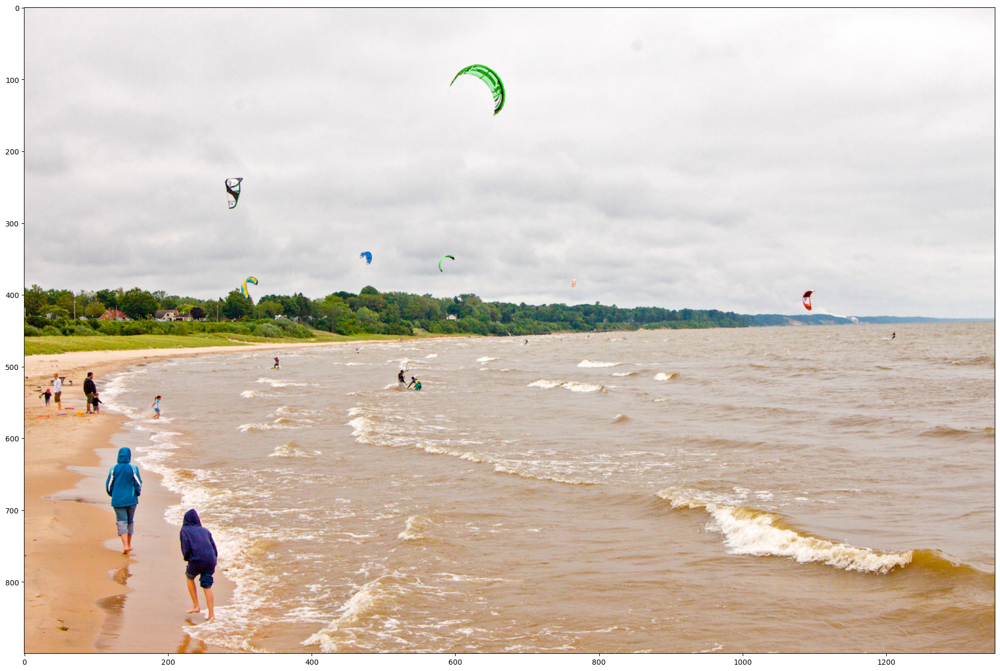

In [14]:
#@title Image Selection (don't forget to execute the cell!) { display-mode: "form"}
selected_image = 'Beach' # @param ['Beach', 'Dogs', 'Naxos Taverna', 'Beatles', 'Phones', 'Birds']
flip_image_horizontally = False #@param {type:"boolean"}
convert_image_to_grayscale = False #@param {type:"boolean"}

image_path = IMAGES_FOR_TEST[selected_image]
image_np = load_image_into_numpy_array(image_path)

# Flip horizontally
if(flip_image_horizontally):
  image_np[0] = np.fliplr(image_np[0]).copy()

# Convert image to grayscale
if(convert_image_to_grayscale):
  image_np[0] = np.tile(
    np.mean(image_np[0], 2, keepdims=True), (1, 1, 3)).astype(np.uint8)

plt.figure(figsize=(24,32))
plt.imshow(image_np[0])
plt.show()

## 추론 시작하기  
TF Hub에서 불러온 모델을 통해 이미지 추론을 시작할 것이다.  

result 필드는 딕셔너리로서 아래와 같은 작업을 수행해 볼 수 있다.
- `result['detection_boxes']` 를 출력시키고 출력된 박스의 위치를 이미지의 박스와 매치해본다.  
    (좌표는 0~1 스케일의 정규화된 값(Normalize)으로 알려줄 것이다.)
- result.keys() 메소드를 통해 출력되는 다른 키들도 result에 대입하여 검사해본다.  
    출력되는 키와 관련된 전체 내용은 TF Hub의 모델 설명 문서 페이지에서 확인할 수 있다.  
    현재 모델의 핸들을 모른다면 `model_display_name` 필드를 출력하면 된다.  
    (~~위에서 모델 핸들을 출력하는 것을 진행했었다~~  )
    

In [20]:
# running inference
results = hub_model(image_np)

# different object detection models have additional results
# all of them are explained in the documentation
result = {key:value.numpy() for key,value in results.items()}
print(result.keys())
print(result['num_detections'])
print(model_display_name)

dict_keys(['detection_classes', 'num_detections', 'detection_keypoint_scores', 'detection_scores', 'detection_boxes', 'detection_keypoints'])
[100.]
CenterNet HourGlass104 Keypoints 512x512


## 결과 시각화 하기  
TF2 object detection API를 통해서 추론 결과에 대해 사각형(또는 가능하다면 특징점) 을 그릴 수 있다.  
- viz_utils.visualize_boxes_and_labels_on_image_array() 메소드 등

API에서 활용가능한 전체 메소드를 확인하고 싶다면 아래 링크로 접속하면 된다.  
https://github.com/tensorflow/models/blob/master/research/object_detection/utils/visualization_utils.py

활용 예시  
- `min_score_thresh` 파라미터의 값을 변경하여 최대로 탐지할 객체의 수 또는 탐지에 사용할 필터의 수를 조절할 수 있음. (0~1 스케일)

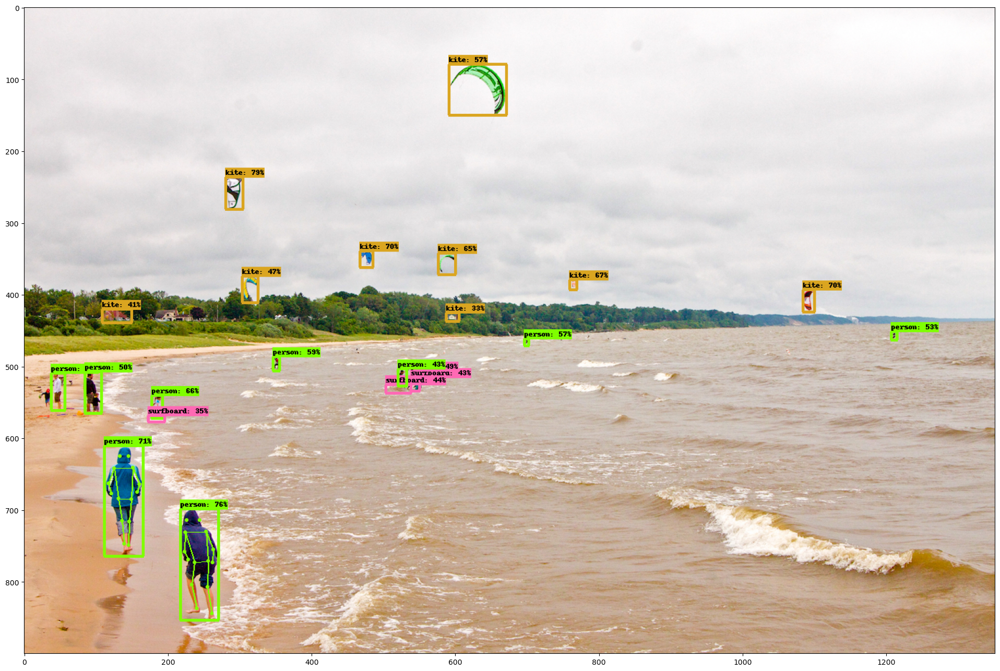

In [23]:
label_id_offset = 0
image_np_with_detections = image_np.copy()

# Use keypoints if available in detections
keypoints, keypoint_scores = None, None
if 'detection_keypoints' in result:
  keypoints = result['detection_keypoints'][0]
  keypoint_scores = result['detection_keypoint_scores'][0]

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections[0],
      result['detection_boxes'][0],
      (result['detection_classes'][0] + label_id_offset).astype(int),
      result['detection_scores'][0],
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.30,
      agnostic_mode=False,
      keypoints=keypoints,
      keypoint_scores=keypoint_scores,
      keypoint_edges=COCO17_HUMAN_POSE_KEYPOINTS)

plt.figure(figsize=(24,32))
plt.imshow(image_np_with_detections[0])
plt.show()
     

## 참고사항
사용 가능한 객체 탐지 모델 중에는 인스턴스 분할을 허용하는 Mask R-CNN 이 있다.  
해당 모델 또한 시각화를 위해 모두 동일한 메소드를 사용하지만, 별도의 매개변수를 추가하여야 한다.  
__인스턴스 분할이란 객체 검출을 확장하여 검출된 각각의 인스턴스를 픽셀 수준으로 분할하는 것을 말한다__  

### Mask R-CNN 등 인스턴스 분할 허용 모델은 아래의 파라미터를 꼭 주자.
`instance_masks=output_dict.get('detection_masks_reframed', None)`  

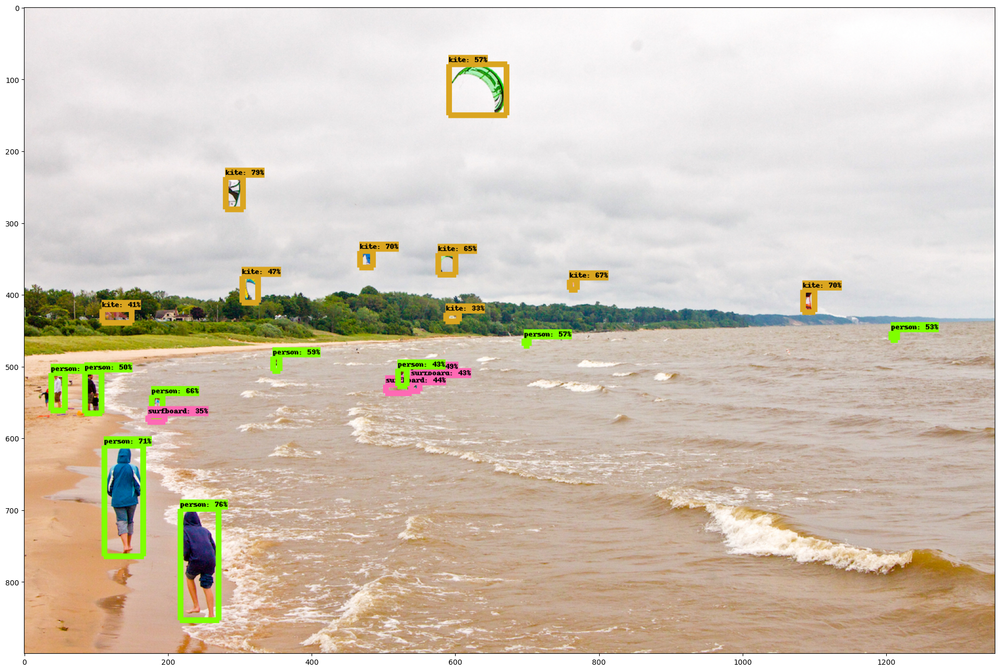

In [24]:
# Handle models with masks:
image_np_with_mask = image_np.copy()

if 'detection_masks' in result:
  # we need to convert np.arrays to tensors
  detection_masks = tf.convert_to_tensor(result['detection_masks'][0])
  detection_boxes = tf.convert_to_tensor(result['detection_boxes'][0])

  # Reframe the bbox mask to the image size.
  detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
            detection_masks, detection_boxes,
              image_np.shape[1], image_np.shape[2])
  detection_masks_reframed = tf.cast(detection_masks_reframed > 0.5,
                                      tf.uint8)
  result['detection_masks_reframed'] = detection_masks_reframed.numpy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_mask[0],
      result['detection_boxes'][0],
      (result['detection_classes'][0] + label_id_offset).astype(int),
      result['detection_scores'][0],
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.30,
      agnostic_mode=False,
      instance_masks=result.get('detection_masks_reframed', None),
      line_thickness=8)

plt.figure(figsize=(24,32))
plt.imshow(image_np_with_mask[0])
plt.show()
     

## Conclusion

TF Hub 에서 좋은 모델을 구해다가 적절히 상속하고 오버라이딩 하면 내가 원하는 모델로서 튜닝할 수 있겠다는 방향성을 보았다.  
utils 하위의 각각의 모듈과 visualizeation_utils 모듈에 대해 보다 자세하게 정리해서 나만의 모델로서 튜닝하고, 다양한 분야에 응용해보고자 한다.  

## 참고 URL  
TF2 Object Detection colab 설명서 원문  
https://github.com/tensorflow/hub/blob/master/examples/colab/tf2_object_detection.ipynb  
Object Detective API - utils.visualizeation_utils 모듈 GitHub  
https://github.com/tensorflow/models/blob/master/research/object_detection/utils/visualization_utils.py